**Library Imports**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.api as sm

**Data Loading**

In [4]:
SLIPPAGE_CSV = "slippage.csv"

#Load dataset
slippage_df = pd.read_csv(SLIPPAGE_CSV)

**Data Exploration and Overview**

In [6]:
print("##################### Shape #####################")
print(slippage_df.shape)
print("##################### Types #####################")
print(slippage_df.dtypes)
print("##################### Head #####################")
print(slippage_df.head())
print("##################### Tail #####################")
print(slippage_df.tail())
print("##################### NA #####################")
print(slippage_df.isnull().sum())


##################### Shape #####################
(2409499, 21)
##################### Types #####################
event_type_trade         object
event_time_trade          int64
agg_trade_id              int64
symbol_trade             object
trade_price             float64
trade_quantity          float64
first_trade_id            int64
last_trade_id             int64
trade_time_trade          int64
is_market_maker            bool
event_type_book          object
order_book_update_id    float64
symbol_book              object
bid_price               float64
bid_quantity            float64
ask_price               float64
ask_quantity            float64
trade_time_book         float64
event_time_book         float64
mid_price               float64
slippage_bps            float64
dtype: object
##################### Head #####################
  event_type_trade  event_time_trade  agg_trade_id symbol_trade  trade_price  \
0         aggTrade     1740689182135    2592130255      BTCUSDT      83

In [7]:
# Remove rows with missing values
slippage_df.dropna(inplace=True)

# Drop unnecessary columns
columns_to_drop = ["agg_trade_id", "event_type_trade", "event_type_book" ,"event_time_trade", "symbol_trade", "first_trade_id", 
                   "last_trade_id", "symbol_book","order_book_update_id","event_time_book"]
slippage_df.drop(columns=columns_to_drop, inplace=True)
slippage_df.head()

,trade_price,trade_quantity,trade_time_trade,is_market_maker,bid_price,bid_quantity,ask_price,ask_quantity,trade_time_book,mid_price,slippage_bps
1,83205.6,0.636,1740689182132,True,83205.6,5.263,83205.7,3.193,1.740689e+12,83205.65,-0.006009
2,83204.2,0.002,1740689182202,True,83204.1,0.008,83204.2,0.604,1.740689e+12,83204.15,0.006009
3,83204.1,0.006,1740689182206,True,83202.0,0.102,83202.1,0.547,1.740689e+12,83202.05,0.246382
4,83203.6,0.006,1740689182206,True,83202.0,0.102,83202.1,0.547,1.740689e+12,83202.05,0.186290
5,83203.3,0.003,1740689182206,True,83202.0,0.102,83202.1,0.547,1.740689e+12,83202.05,0.150234


In [8]:
#  Piyasa Likiditesi (Bid-Ask Spread)
slippage_df["spread_bps"] = ((slippage_df["ask_price"] - slippage_df["bid_price"]) / slippage_df["mid_price"]) * 10000

#  Volatilite (Fiyat Dalgalanması - Rolling Std)
slippage_df["rolling_volatility"] = slippage_df["trade_price"].rolling(window=3).std()

#  İşlem Hacmi (Cumulative Volume)
slippage_df["cumulative_trade_volume"] = slippage_df["trade_quantity"].cumsum()

#  Tick Volume (İşlem Sayısı)
slippage_df["tick_volume"] = slippage_df.groupby("trade_time_trade")["trade_price"].transform("count")

#  Ortalama İşlem Büyüklüğü (Trade Size)
slippage_df["avg_trade_size"] = slippage_df["trade_quantity"].rolling(window=50, min_periods=1).mean()

#  İşlem Yoğunluğu (Tick Frequency)
slippage_df["tick_frequency"] = slippage_df["tick_volume"] / (slippage_df["trade_time_trade"].max() - slippage_df["trade_time_trade"].min())

#  İşlem Hacmi Yoğunluğu (Volume Intensity)
slippage_df["volume_intensity"] = slippage_df["trade_quantity"] / (slippage_df["trade_time_trade"].max() - slippage_df["trade_time_trade"].min())

# Remove rows with missing values
slippage_df.dropna(inplace=True)

In [9]:
# Convert time columns to datetime format
slippage_df['trade_time_trade'] = pd.to_datetime(slippage_df['trade_time_trade'], unit='ms')
slippage_df['trade_time_book'] = pd.to_datetime(slippage_df['trade_time_book'], unit='ms')
if "is_market_maker" in slippage_df.columns:
    slippage_df["is_market_maker"] = slippage_df["is_market_maker"].astype(int)

slippage_df.head(10)

,trade_price,trade_quantity,trade_time_trade,is_market_maker,bid_price,bid_quantity,ask_price,ask_quantity,trade_time_book,mid_price,slippage_bps,spread_bps,rolling_volatility,cumulative_trade_volume,tick_volume,avg_trade_size,tick_frequency,volume_intensity
3,83204.1,0.006,2025-02-27 20:46:22.206,1,83202.0,0.102,83202.1,0.547,2025-02-27 20:46:22.206,83202.05,0.246382,0.012019,0.838650,0.644,4,0.214667,1.000058e-07,1.500087e-10
4,83203.6,0.006,2025-02-27 20:46:22.206,1,83202.0,0.102,83202.1,0.547,2025-02-27 20:46:22.206,83202.05,0.186290,0.012019,0.321455,0.650,4,0.162500,1.000058e-07,1.500087e-10
5,83203.3,0.003,2025-02-27 20:46:22.206,1,83202.0,0.102,83202.1,0.547,2025-02-27 20:46:22.206,83202.05,0.150234,0.012019,0.404145,0.653,4,0.130600,1.000058e-07,7.500434e-11
6,83202.2,0.002,2025-02-27 20:46:22.206,1,83202.0,0.102,83202.1,0.547,2025-02-27 20:46:22.206,83202.05,0.018028,0.012019,0.737111,0.655,4,0.109167,1.000058e-07,5.000289e-11
7,83201.4,0.091,2025-02-27 20:46:22.212,1,83201.2,0.106,83201.3,2.552,2025-02-27 20:46:22.212,83201.25,0.018029,0.012019,0.953939,0.746,1,0.106571,2.500145e-08,2.275132e-09
8,83201.2,0.108,2025-02-27 20:46:22.245,1,83200.8,0.120,83200.9,2.187,2025-02-27 20:46:22.245,83200.85,0.042067,0.012019,0.529150,0.854,1,0.106750,2.500145e-08,2.700156e-09
9,83200.8,0.122,2025-02-27 20:46:22.309,1,83200.0,9.622,83200.1,2.243,2025-02-27 20:46:22.309,83200.05,0.090143,0.012019,0.305505,0.976,1,0.108444,2.500145e-08,3.050177e-09
10,83200.1,0.009,2025-02-27 20:46:22.382,0,83200.0,9.622,83200.1,14.880,2025-02-27 20:46:22.382,83200.05,-0.006010,0.012019,0.556776,0.985,1,0.098500,2.500145e-08,2.250130e-10
11,83200.0,0.454,2025-02-27 20:46:22.396,1,83200.0,9.621,83200.1,14.880,2025-02-27 20:46:22.396,83200.05,-0.006010,0.012019,0.435890,1.439,1,0.130818,2.500145e-08,1.135066e-08
12,83200.0,9.172,2025-02-27 20:46:22.562,1,83199.1,0.002,83199.2,1.048,2025-02-27 20:46:22.562,83199.15,0.102163,0.012019,0.057735,10.611,3,0.884250,7.500434e-08,2.293133e-07


In [10]:
# Check if time columns are sorted
is_trade_time_sorted = slippage_df['trade_time_trade'].is_monotonic_increasing
is_book_time_sorted = slippage_df['trade_time_book'].is_monotonic_increasing

print("##################### Time Sorting Check #####################")
print(f"Trade time sorted: {is_trade_time_sorted}")
print(f"Book time sorted: {is_book_time_sorted}")


##################### Time Sorting Check #####################
Trade time sorted: True
Book time sorted: True


In [11]:
# Time Range Analysis
start_time = slippage_df['trade_time_trade'].min()
end_time = slippage_df['trade_time_trade'].max()
time_diff = end_time - start_time
print(f"First Trade Time (UTC): {start_time}")
print(f"Last Trade Time (UTC): {end_time}")
print(f"Total Time Span: {time_diff}")

First Trade Time (UTC): 2025-02-27 20:46:22.206000
Last Trade Time (UTC): 2025-02-28 07:52:59.817000
Total Time Span: 0 days 11:06:37.611000


In [12]:
pd.set_option('display.float_format', '{:,.3f}'.format)

# Summary Statistics
summary_stats = slippage_df[['trade_price', 'trade_quantity', 'bid_price', 'bid_quantity', 'ask_price', 'ask_quantity' ,'mid_price','slippage_bps',
                             'spread_bps', 'rolling_volatility', 'cumulative_trade_volume', 'tick_volume', 'avg_trade_size', 'tick_frequency',
                            'volume_intensity', 'is_market_maker']].describe()
print("Summary Statistics:\n", summary_stats)



Summary Statistics:
         trade_price  trade_quantity     bid_price  bid_quantity     ask_price  \
count 2,409,496.000   2,409,496.000 2,409,496.000 2,409,496.000 2,409,496.000   
mean     81,055.050           0.119    81,053.630         1.277    81,056.825   
std       1,581.041           0.701     1,581.031         4.569     1,580.606   
min      78,787.000           0.001    78,787.000         0.001    78,788.800   
25%      79,825.600           0.002    79,824.600         0.036    79,827.900   
50%      80,480.000           0.005    80,478.700         0.346    80,480.800   
75%      82,172.500           0.048    82,170.900         1.227    82,175.000   
max      84,894.000         179.657    84,893.900       215.975    84,894.000   

       ask_quantity     mid_price  slippage_bps    spread_bps  \
count 2,409,496.000 2,409,496.000 2,409,496.000 2,409,496.000   
mean          1.282    81,055.227        -0.245         0.395   
std           5.952     1,580.815         1.153       

**Some Graphs to Understand Metrics**

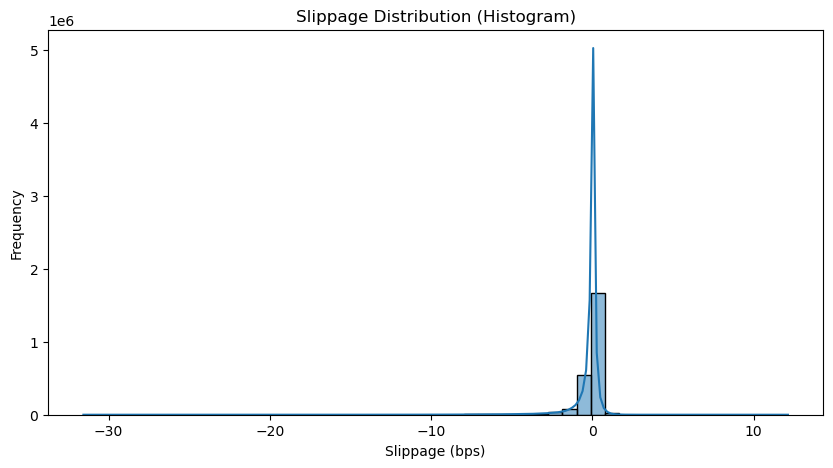

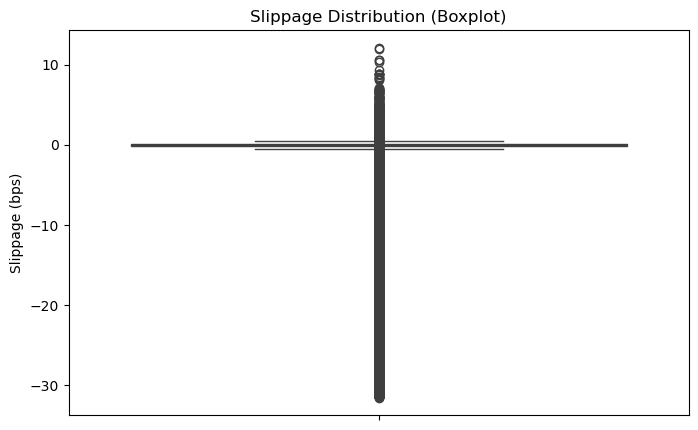

In [14]:
# Slippage Distribution Analysis
plt.figure(figsize=(10,5))
sns.histplot(slippage_df['slippage_bps'], bins=50, kde=True)
plt.xlabel("Slippage (bps)")
plt.ylabel("Frequency")
plt.title("Slippage Distribution (Histogram)")
plt.show()

plt.figure(figsize=(8,5))
sns.boxplot(y=slippage_df['slippage_bps'])
plt.ylabel("Slippage (bps)")
plt.title("Slippage Distribution (Boxplot)")
plt.show()

In [15]:
# Compute average slippage per second
slippage_df['trade_time_seconds'] = slippage_df['trade_time_trade'].dt.floor('S')
avg_slippage_per_sec = slippage_df.groupby('trade_time_seconds')['slippage_bps'].mean().reset_index()

# Interactive plot with Plotly
fig = px.line(avg_slippage_per_sec, x='trade_time_seconds', y='slippage_bps',
              title='Average Slippage Per Second', labels={'trade_time_seconds': 'Time (Seconds)', 'slippage_bps': 'Average Slippage (bps)'})
fig.show()

C:\Users\ciyab\AppData\Local\Temp\ipykernel_4080\234147919.py:2: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  slippage_df['trade_time_seconds'] = slippage_df['trade_time_trade'].dt.floor('S')


C:\Users\ciyab\AppData\Local\Temp\ipykernel_4080\852572465.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




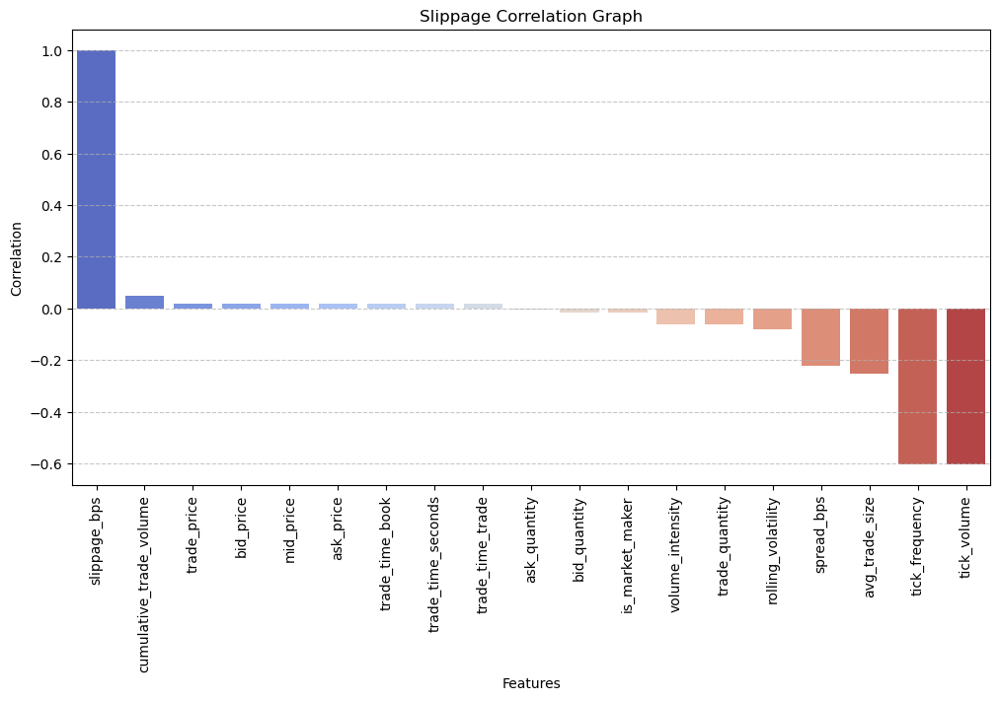

In [16]:
# Calculate the correlation matrix
correlation_matrix = slippage_df.corr()

# Extract correlation values for slippage_bps
slippage_corr = correlation_matrix["slippage_bps"].dropna().sort_values(ascending=False)

# Plot the correlation graph
plt.figure(figsize=(12, 6))
sns.barplot(x=slippage_corr.index, y=slippage_corr.values, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.title("Slippage Correlation Graph")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

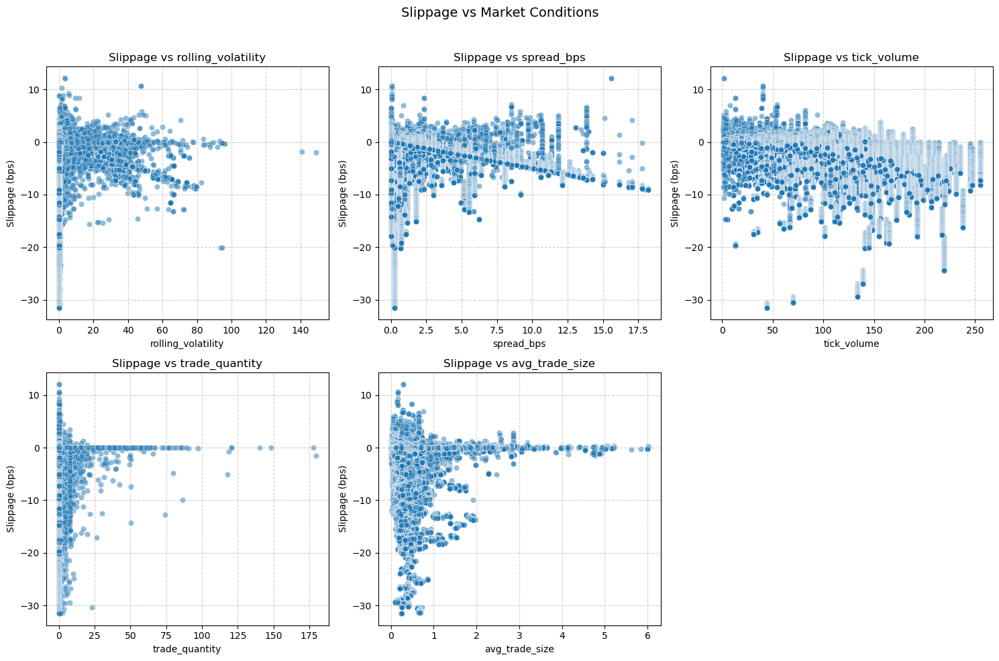

In [17]:
# Define the features to plot against slippage_bps
features = ["rolling_volatility", "spread_bps", "tick_volume", "trade_quantity", "avg_trade_size"]

# Set up the figure and axes for subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  
fig.suptitle("Slippage vs Market Conditions", fontsize=14)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each feature against slippage_bps
for i, feature in enumerate(features):
    sns.scatterplot(x=slippage_df[feature], y=slippage_df["slippage_bps"], alpha=0.5, ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Slippage (bps)")
    axes[i].set_title(f"Slippage vs {feature}")
    axes[i].grid(True, linestyle="--", alpha=0.6)

# Hide any unused subplot (since we created 6 but only need 5)
for j in range(len(features), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plots
plt.show()


In [18]:
# Selecting relevant features for regression
features = ["rolling_volatility", "spread_bps", "tick_volume", "trade_quantity", "avg_trade_size"]
X = slippage_df[features]
y = slippage_df["slippage_bps"]

# Adding constant for intercept
X = sm.add_constant(X)

# Performing OLS regression
model = sm.OLS(y, X).fit()

# Display the regression results
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:           slippage_bps   R-squared:                       0.390
Model:                            OLS   Adj. R-squared:                  0.390
Method:                 Least Squares   F-statistic:                 3.081e+05
Date:                Mon, 03 Mar 2025   Prob (F-statistic):               0.00
Time:                        02:47:55   Log-Likelihood:            -3.1669e+06
No. Observations:             2409496   AIC:                         6.334e+06
Df Residuals:                 2409490   BIC:                         6.334e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2895      0

C:\Users\ciyab\AppData\Local\Temp\ipykernel_4080\958618113.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




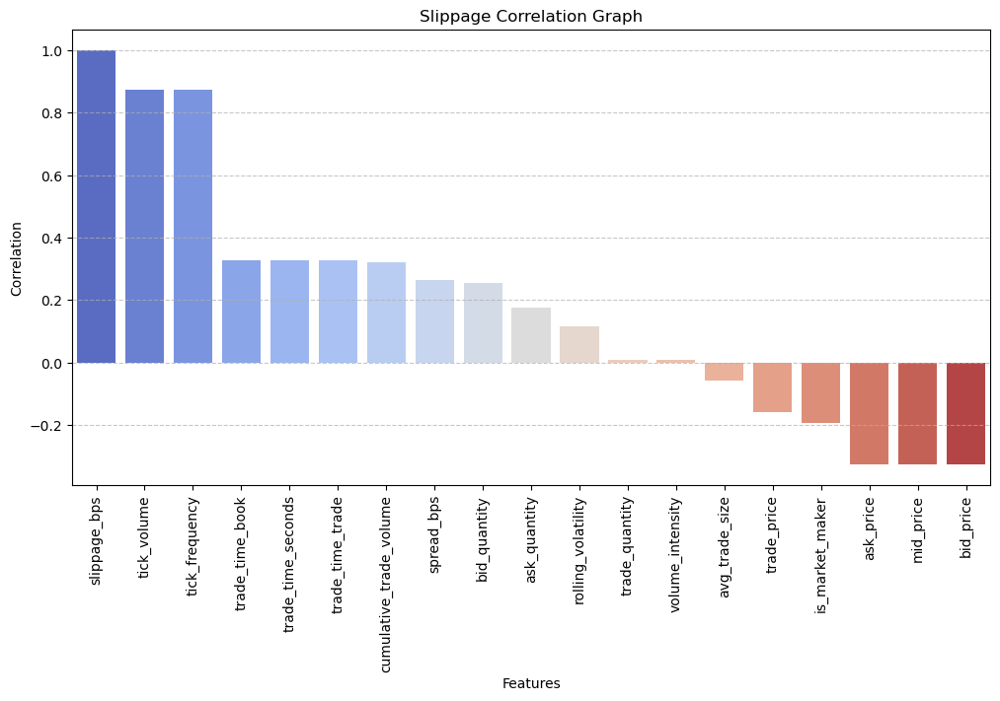

In [24]:
filtered_slippage_df = slippage_df[abs(slippage_df['slippage_bps']) >= 20]
filtered_correlation_matrix = filtered_slippage_df.corr()
filtered_slippage_corr = filtered_correlation_matrix["slippage_bps"].dropna().sort_values(ascending=False)

# Plot the correlation graph
plt.figure(figsize=(12, 6))
sns.barplot(x=filtered_slippage_corr.index, y=filtered_slippage_corr.values, palette="coolwarm")
plt.xticks(rotation=90)
plt.xlabel("Features")
plt.ylabel("Correlation")
plt.title("Slippage Correlation Graph")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()

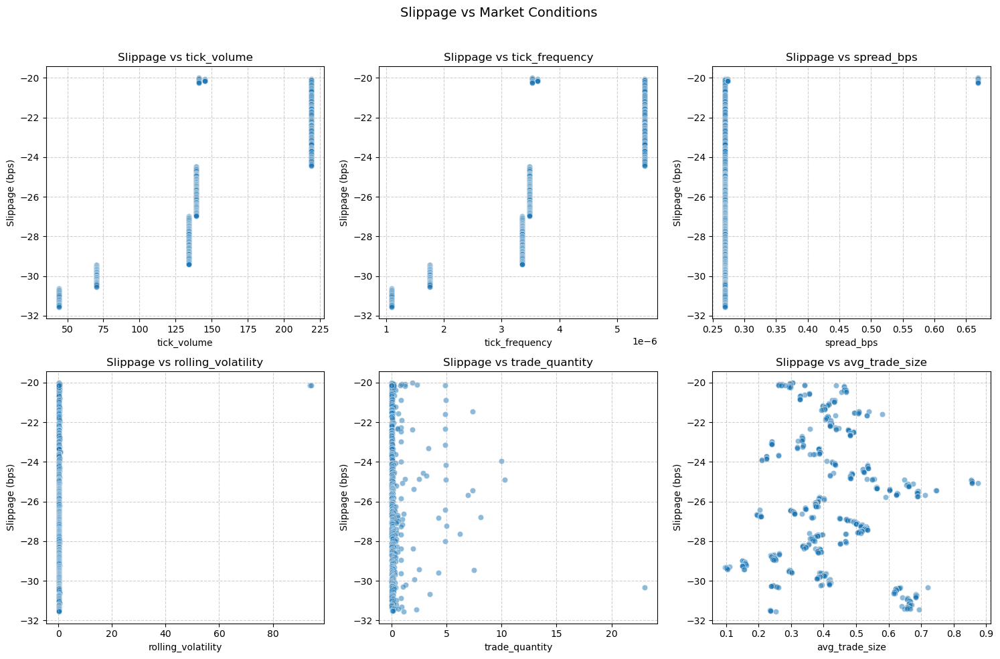

In [34]:
# Define the features to plot against slippage_bps
features = ["tick_volume", "tick_frequency","spread_bps",
           "rolling_volatility", "trade_quantity", "avg_trade_size"]


# Set up the figure and axes for subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  
fig.suptitle("Slippage vs Market Conditions", fontsize=14)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot each feature against slippage_bps
for i, feature in enumerate(features):
    sns.scatterplot(x=filtered_slippage_df[feature], y=filtered_slippage_df["slippage_bps"], alpha=0.5, ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Slippage (bps)")
    axes[i].set_title(f"Slippage vs {feature}")
    axes[i].grid(True, linestyle="--", alpha=0.6)

# Hide any unused subplot (since we created 6 but only need 5)
for j in range(len(features), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Show the plots
plt.show()
